# Data Visualization

In [94]:
import seaborn as sns
import os
import csv
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
# import scipy.stats as stats

import math
pd.set_option('display.max_rows', None, 'display.max_columns', None, 'display.width', None)  # Show all rows
# pd.set_option('display.max_columns', None)  # Show all columns
# pd.set_option('display.width', None)  # Allow full width of display
import plotly.graph_objs as go
from matplotlib.dates import DateFormatter
from collections import Counter
import random 
# default_figsize = plt.rcParams['figure.figsize']
# # Reset the figure size to default
# plt.rcParams['figure.figsize'] = default_figsize


In [ ]:
# possible color scheme using sns
# sns.color_palette() #default color scheme

# sns.color_palette("pastel")
# with sns.color_palette("Set3"):
# sns.color_palette("Set2")
# sns.color_palette("Spectral", as_cmap=True)
# sns.color_palette("husl", 9)



In [3]:

#them param:
sns.set_theme()
# For the image quality of the graphic.
# sns.set(rc={"figure.dpi":300})
# # For the size of the graphics
# sns.set(rc = {"figure.figsize":(6,3)})

#Distribution Plot: 1numerical
df.hist(bins = 50)
sns.histplot(x = "flipper_length_mm", data = data, binwidth = 3, kde=True,  y="flipper_length_mm")


sns.distplot(x = df['age'], bins = 10) 

#massive any 2numerical
# Pair Plot:takes all the numerical attributes of the data and plot pairwise scatter plot for two different variables, pairing of each 2 numericals
sns.pairplot(df)

#1categorical
sns.countplot(df['Pclass'])

#Barplot: 1numerical + 1categorical, with stdev bar
sns.barplot(x = df['Sex'], y = df['Fare'])
#counts the number of occurrences of categorical variables. Like df.value_counts(): 1 categorical

# Boxplot:1numerical + 1categorical 5points
sns.boxplot(y = df['Age'], x = df['Sex'])
sns.violinplot(y = df['Age'], x = df['Sex'])
#1numerical + 1categorical scatter distributed
sns.stripplot(y = df['Age'], x = df['Pclass'])
# provides their respective distribution.
sns.swarmplot(y = train['Age'], x = train['Pclass'])

#1numerical + 1categorical: distribution by group level
sns.histplot(data=data, x="flipper_length_mm", hue="species")
#softcurve distribution by group level
sns.kdeplot(data=penguins, x="flipper_length_mm", hue="species", multiple="stack")
sns.displot(data=penguins, x="flipper_length_mm", hue="species", multiple="stack", kind="kde")



#Correlation: corr plot for every pairing of each 2numericals, identify correlation
df.corr()
sns.heatmap(df.corr(), annot = True, cmap = 'viridis')
#heatmap to identify missing value
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

#numerical distribution histogram across 2 categoricals: 1numerical + 2categorical: 
sns.FacetGrid(train, col = 'Pclass', row = 'Sex').map(sns.distplot, 'Age')

#regression plot, 2numerical (+1categorical) scatter plot
sns.lmplot(x = 'Age', y = 'PassengerId', data = df, hue = 'Sex')

#scatterplot, 2numerical (+1categorical) scatter plot
sns.scatterplot( x = "bill_length_mm",
                y = "bill_depth_mm",
                data = data,
                hue = "species")

# a heatmap of multiple 2numerical + 1categorical, scatterplot by 1categorical
sns.pairplot(data=penguins, hue="species")
sns.jointplot(data=penguins, x="flipper_length_mm", y="bill_length_mm", hue="species", kind="hist")





NameError: name 'df' is not defined

In [6]:
os.chdir('/Users/emilyli/workspace/datasets')
df = pd.read_csv('data_science_salaries.csv')
df = df[df['employment_type'].isin(['Full-time'])] #only care abouut ft
df['work_year'] = pd.to_datetime(df['work_year'] )
# df['work_year'] = pd.to_datetime(df['work_year'], format='%Y')
# df['work_year'] = df['work_year'].dt.year
# not necessary to convert from int to str b/c the plot for it might not be the right order as str
# df['work_year'] = df['work_year'].astype(str)


In [10]:
df7= pd.read_csv("factors_affect_children_anemia.csv")
df7.columns = df7.columns.str.lower()
df7.rename(columns=lambda x: x.replace(' ', '_').replace('.', '_'), inplace=True)


In [4]:
mean, var, skew, kurt = norm.stats(moments='mvsk')
display(mean, var, skew, kurt)

0.0

1.0

0.0

0.0

In [43]:
x = np.linspace(norm.ppf(0.01),
                norm.ppf(0.99), 100)


In [65]:
data = [12, 12, 13, 13, 15, 16, 17, 22, 23, 25, 26, 27, 28, 28, 29]

loc = 20.4
scale = 6.354001363970055
display(norm.median(loc, scale))
display(norm.mean(loc, scale))
display(norm.var(loc, scale))
display(norm.std(loc, scale))
display(norm.interval(0.95, loc, scale))

20.4

20.4

40.37333333333332

6.354001363970055

(7.946386168900311, 32.853613831099686)

In [60]:
display(norm.median( loc, scale))
display(norm.mean(loc, scale))
display(norm.var(loc, scale))
display(norm.std(loc, scale))

20.4

20.4

40.37333333333332

6.354001363970055

In [51]:
# (Differential) entropy of the RV.
norm.entropy(loc=0, scale=1)

1.4189385332046727

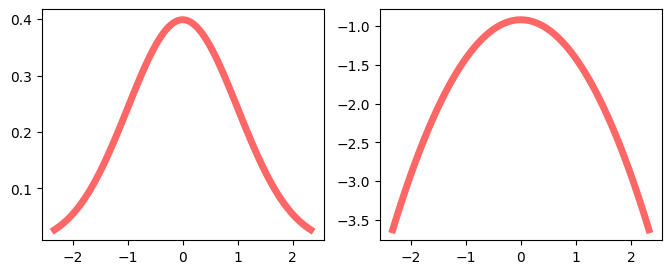

In [45]:
# rv = norm()
# plt.plot(x, rv.pdf(x), 'k-', lw=2, label='frozen pdf')

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

norm_pdf = norm.pdf(x)
axes[0].plot(x, norm_pdf,
       'r-', lw=5, alpha=0.6, label='norm pdf')

log_pdf = norm.logpdf(x)
axes[1].plot(x, log_pdf,
       'r-', lw=5, alpha=0.6, label='log pdf')


In [25]:
# generate random variable of Normal distribution
r = norm.rvs(size=1000, loc = 0, scale = 1)



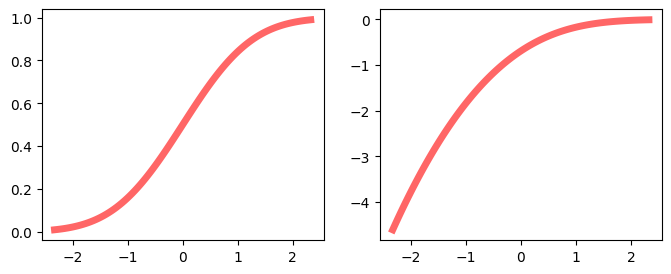

In [46]:


fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

cdf = norm.cdf(x)
axes[0].plot(x, cdf,
       'r-', lw=5, alpha=0.6, label='log pdf')

logcdf = norm.logcdf(x)
axes[1].plot(x, logcdf,
       'r-', lw=5, alpha=0.6, label='log pdf')

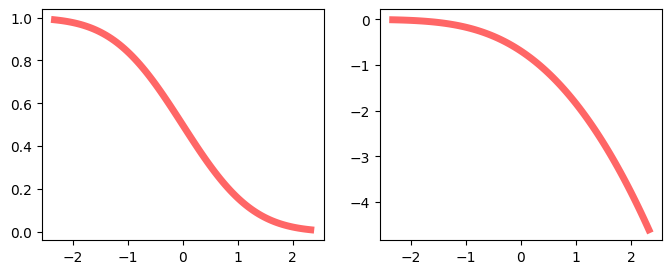

In [47]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

sf = norm.sf(x)
axes[0].plot(x, sf,
       'r-', lw=5, alpha=0.6, label='log pdf')

logsf = norm.logsf(x)
axes[1].plot(x, logsf,
       'r-', lw=5, alpha=0.6, label='log pdf')

ValueError: x and y must have same first dimension, but have shapes (100,) and (1,)

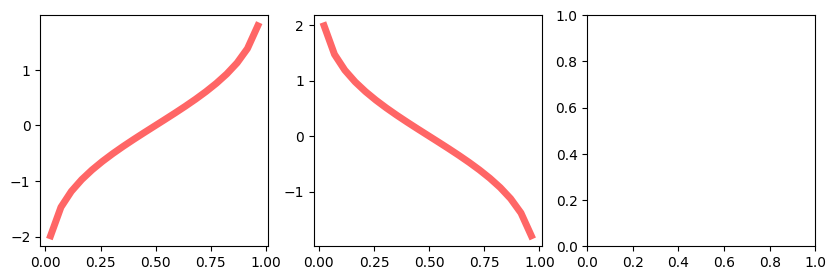

In [50]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 3))

	
# Percent point function (inverse of cdf — percentiles)
ppf = norm.ppf(x)
axes[0].plot(x, ppf,
       'r-', lw=5, alpha=0.6, label='norm pdf')

# Inverse survival function (inverse of sf).
isf = norm.isf(x)
axes[1].plot(x, isf,
       'r-', lw=5, alpha=0.6, label='log pdf')

mom = norm.moment(2)
axes[2].plot(x, mom,
       'r-', lw=5, alpha=0.6, label='log pdf')

array([[<AxesSubplot:title={'center':'work_year'}>,
        <AxesSubplot:title={'center':'salary'}>],
       [<AxesSubplot:title={'center':'salary_in_usd'}>, <AxesSubplot:>]],
      dtype=object)

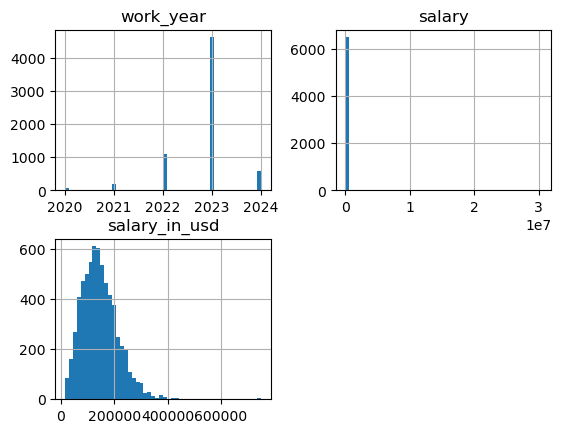

In [7]:
# plt.figure( figsize = (5,3))


df.hist(bins = 50)


In [76]:
df6.head()

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,6.1,6,42,6,Overweight,126/83,77,4200,None
1,2,Male,28,Doctor,6.2,6,60,8,Normal Weight,125/80,75,10000,None
2,3,Male,28,Doctor,6.2,6,60,8,Normal Weight,125/80,75,10000,None
3,4,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea
4,5,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea


<AxesSubplot:xlabel='experience_level', ylabel='count'>

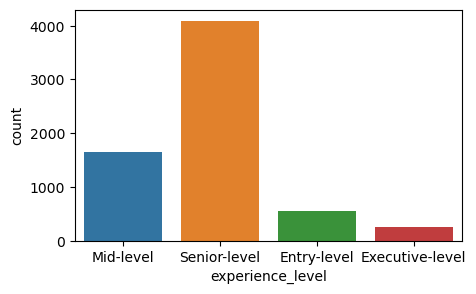

In [16]:
plt.figure( figsize = (5,3))
sns.color_palette()

sns.countplot(x = df['experience_level'])


# df.dtypes

In [11]:
df7.columns

Index(['age_in_5-year_groups', 'type_of_place_of_residence',
       'highest_educational_level', 'wealth_index_combined',
       'births_in_last_five_years', 'age_of_respondent_at_1st_birth',
       'hemoglobin_level_adjusted_for_altitude_and_smoking_(g/dl_-_1_decimal)',
       'anemia_level',
       'have_mosquito_bed_net_for_sleeping_(from_household_questionnaire)',
       'smokes_cigarettes', 'current_marital_status',
       'currently_residing_with_husband/partner', 'when_child_put_to_breast',
       'had_fever_in_last_two_weeks',
       'hemoglobin_level_adjusted_for_altitude_(g/dl_-_1_decimal)',
       'anemia_level_1', 'taking_iron_pills,_sprinkles_or_syrup'],
      dtype='object')

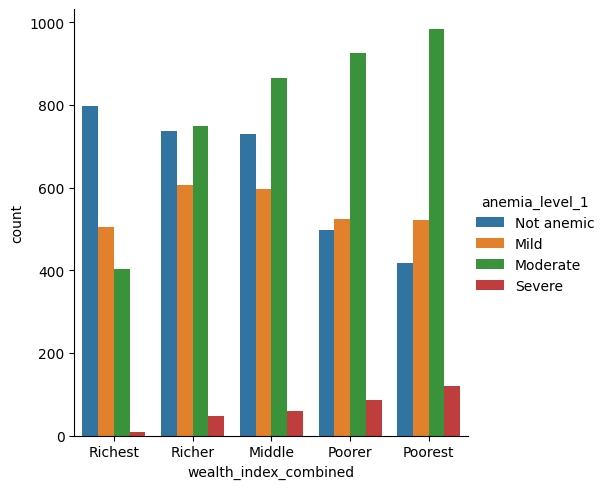

In [13]:
# counts for 2categoricals (counts)
sns.catplot(data=df7, x='wealth_index_combined', hue='anemia_level_1', kind='count')


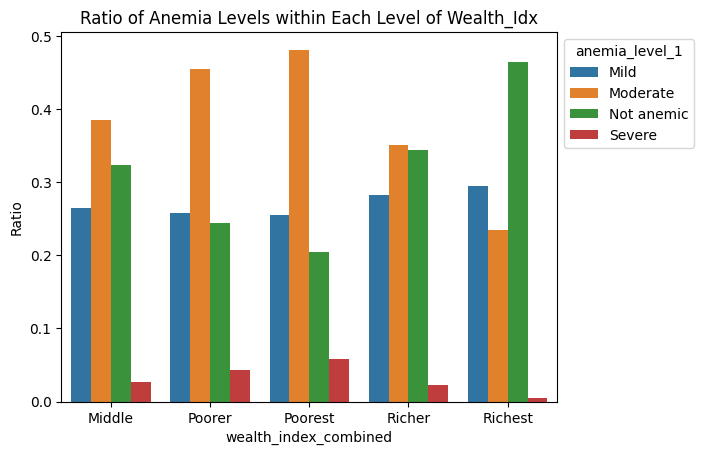

In [22]:
# counts for 2categoricals (ratio of Category2 within each Category1)
# Calculate counts within each level of Category1 and Category2
counts = df7.groupby(['wealth_index_combined', 'anemia_level_1']).size().reset_index(name='Count')

# Calculate total counts within each level of Category1
total_counts = counts.groupby('wealth_index_combined')['Count'].transform('sum')

# Calculate ratio within each level of Category1
counts['Ratio'] = counts['Count'] / total_counts
# Create a count plot of the combinations of Category1 and Category2 with ratio
ax = sns.barplot(data=counts, x='wealth_index_combined', hue='anemia_level_1', y='Ratio')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), title='anemia_level_1')
plt.title('Ratio of Anemia Levels within Each Level of Wealth_Idx')
# Show the plot
plt.show()

In [21]:
counts


,wealth_index_combined,anemia_level_1,Count,Ratio
0,Middle,Mild,596,0.265007
1,Middle,Moderate,865,0.384615
2,Middle,Not anemic,729,0.324144
3,Middle,Severe,59,0.026234
4,Poorer,Mild,525,0.257859
5,Poorer,Moderate,926,0.454813
6,Poorer,Not anemic,498,0.244597
7,Poorer,Severe,87,0.042731
8,Poorest,Mild,522,0.255632
9,Poorest,Moderate,983,0.481391


job_title             object
experience_level      object
employment_type       object
work_models           object
work_year              int64
employee_residence    object
salary                 int64
salary_currency       object
salary_in_usd          int64
company_location      object
company_size          object
dtype: object

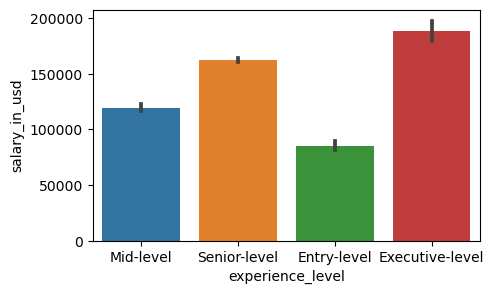

In [155]:
plt.figure( figsize = (5,3))
#barplot w/ stdev by group
sns.barplot(x = df['experience_level'], y = df['salary_in_usd'])
df.dtypes

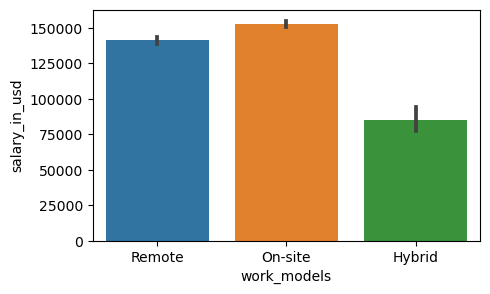

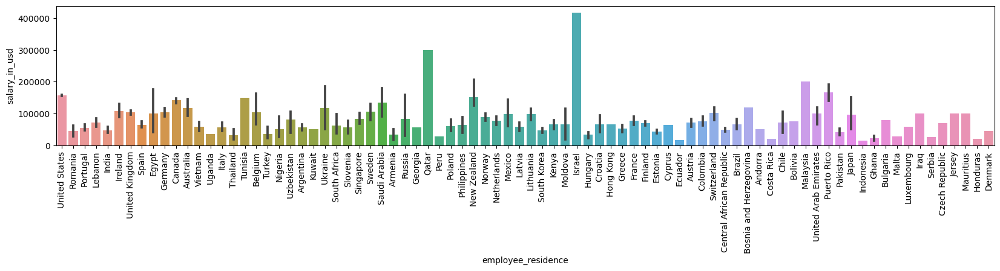

In [17]:
plt.figure( figsize = (5,3))

sns.barplot(x = df['work_models'], y = df['salary_in_usd'])
plt.show()
plt.figure( figsize = (20,3))

sns.barplot(x = df['employee_residence'], y = df['salary_in_usd'])
plt.xticks(rotation=90)

plt.show()

# df.dtypes

In [163]:
df[df['employee_residence'] == 'Israel']

,job_title,experience_level,employment_type,work_models,work_year,employee_residence,salary,salary_currency,salary_in_usd,company_location,company_size
4571,AI Scientist,Senior-level,Full-time,On-site,2023,Israel,1500000,ILS,417937,Israel,Large


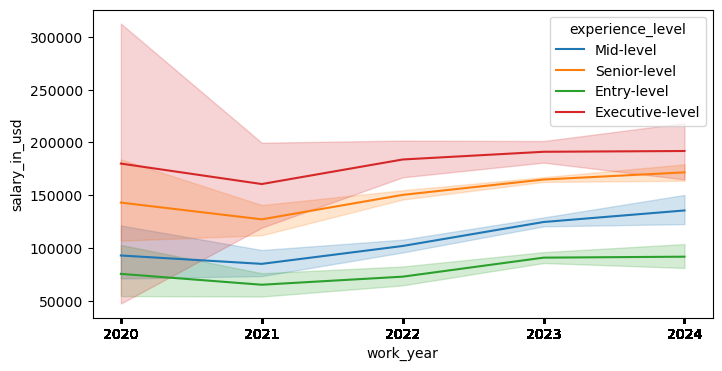

In [8]:
plt.figure(figsize=(8, 4)) 



sns.lineplot(data = df, x = 'work_year', y = 'salary_in_usd' , hue = 'experience_level')
# ways to show year in x-axis as full year is either convert into int to str, or usee the value of the col as plt.xticks()
plt.xticks(df['work_year'])

# Show the plot
plt.show()

In [9]:
job_title_list = list(set((df['job_title'].str.lower())))
# [x for x in job_title_list if 'data' in x]
value_counts = df['job_title'].value_counts()
filtered_counts = value_counts[value_counts >= 30]
filtered_counts
major_job_titles = filtered_counts.index.tolist()
# major_job_titles = [x.lower() for x in major_job_titles]
major_job_titles_df = df[df['job_title'].isin(major_job_titles)]

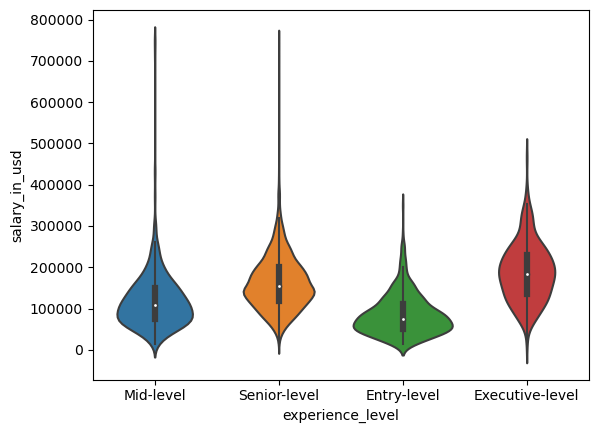

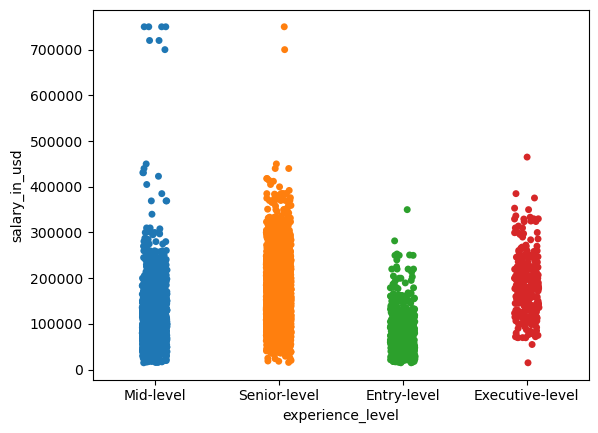

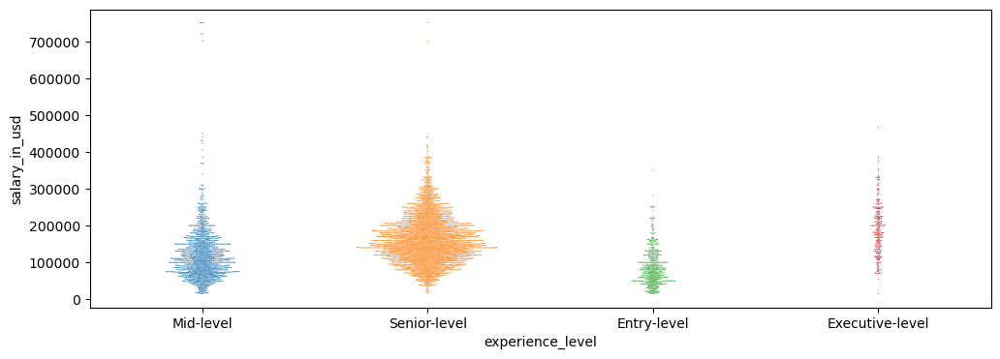

In [10]:
sns.violinplot(y = df['salary_in_usd'], x = df['experience_level'])
plt.show()
#1numerical + 1categorical scatter distributed
sns.stripplot(y = df['salary_in_usd'], x = df['experience_level'])
plt.show()

plt.figure(figsize=(12, 4)) 
# provides their respective distribution. this plot very slow
sns.swarmplot(y = df['salary_in_usd'], x = df['experience_level'], size = 0.8)
plt.show()


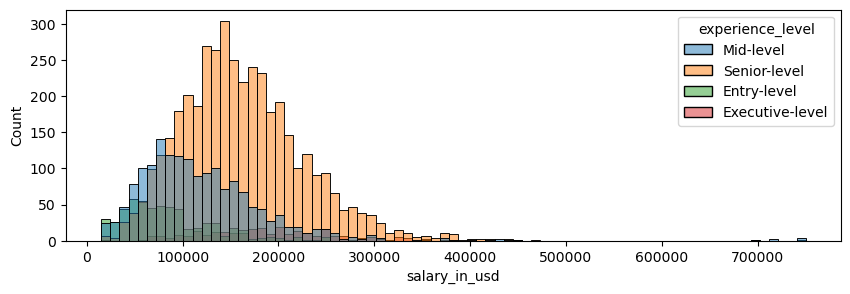

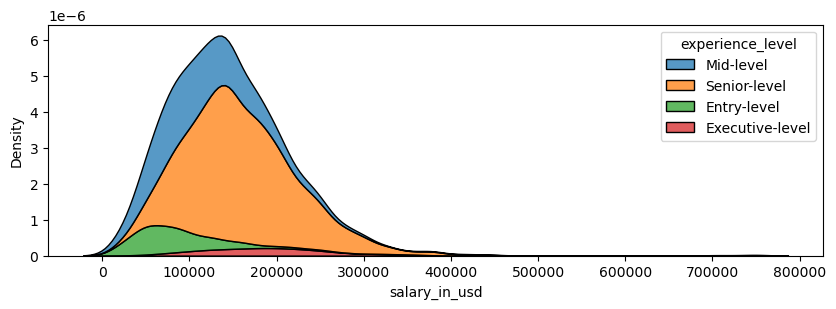

<Figure size 1000x300 with 0 Axes>

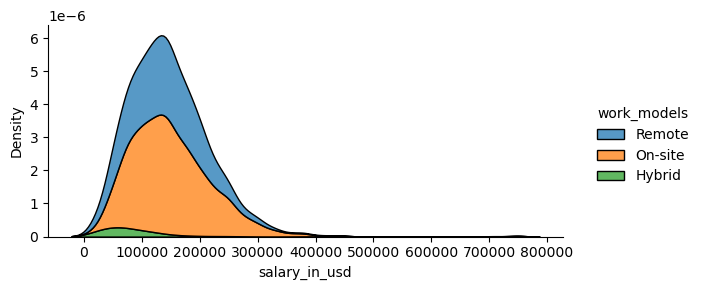

In [190]:
plt.figure(figsize=(10, 3)) 

sns.histplot(data=df, x="salary_in_usd", hue="experience_level")
#softcurve distribution by group level
plt.figure(figsize=(10, 3)) 
sns.kdeplot(data=df, x="salary_in_usd", hue="experience_level", multiple="stack")
# figure-level plot, use height and aspect
sns.displot(data=df, x="salary_in_usd", hue="work_models", multiple="stack", kind="kde", height = 3, aspect = 2)
plt.show()

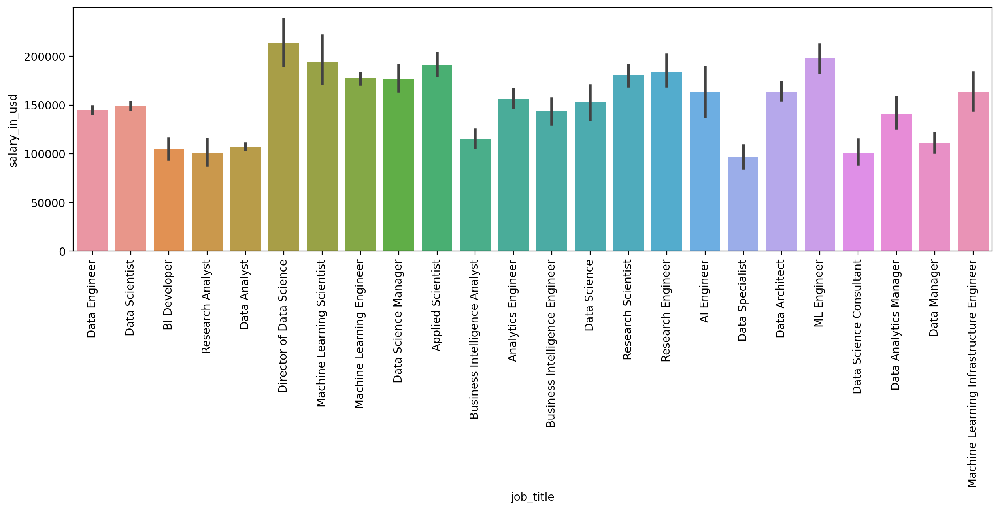

In [125]:

sns.barplot(x = "job_title", y = "salary_in_usd", data = major_job_titles_df)
plt.xticks(rotation=90)

plt.show()

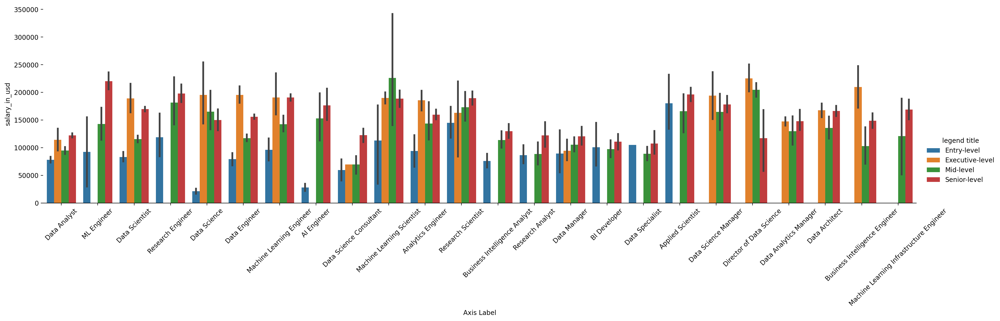

In [126]:
# plt.figure( figsize = (20,4))
# %matplotlib inline
# %config InlineBackend.figure_format ='retina' 
# plt.rcParams['figure.figsize'] = [15, 4] 
# aspect is the reation of width/height
sorted_major_job_titles_df = major_job_titles_df.sort_values(by = ['experience_level','salary_in_usd'])
g = sns.catplot(data = sorted_major_job_titles_df, kind = "bar", x = 'job_title', y = 'salary_in_usd' , hue = 'experience_level', aspect = 4
                # errorbar = "sd", palette="dark", alpha = 0.6, height = 6
               )
g.despine(left=True)
plt.xticks(rotation=45)
g.set_axis_labels("Axis Label")
g.legend.set_title("legend title")
plt.show()

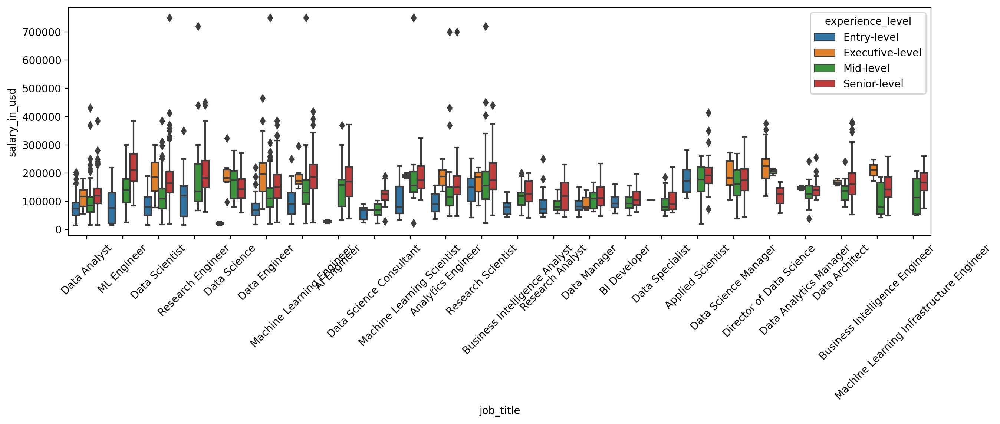

In [127]:
plt.figure(figsize=(15, 4)) 
sns.boxplot(x="job_title", y="salary_in_usd", hue="experience_level", data=sorted_major_job_titles_df)
plt.xticks(rotation=45)
plt.show()


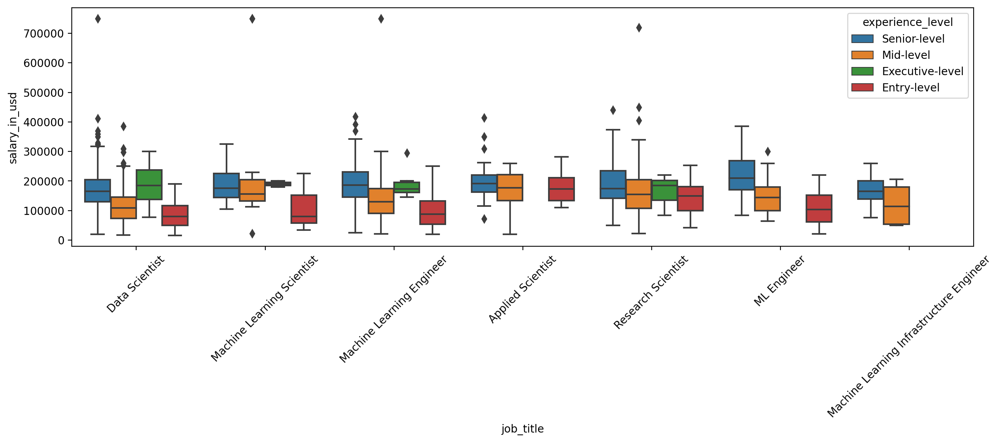

In [128]:
c
plt.figure(figsize=(15, 4)) 
sns.boxplot(x="job_title", y="salary_in_usd", hue="experience_level", data=major_job_titles_df2)
plt.xticks(rotation=45)
# plt.yscale('log')

plt.show()

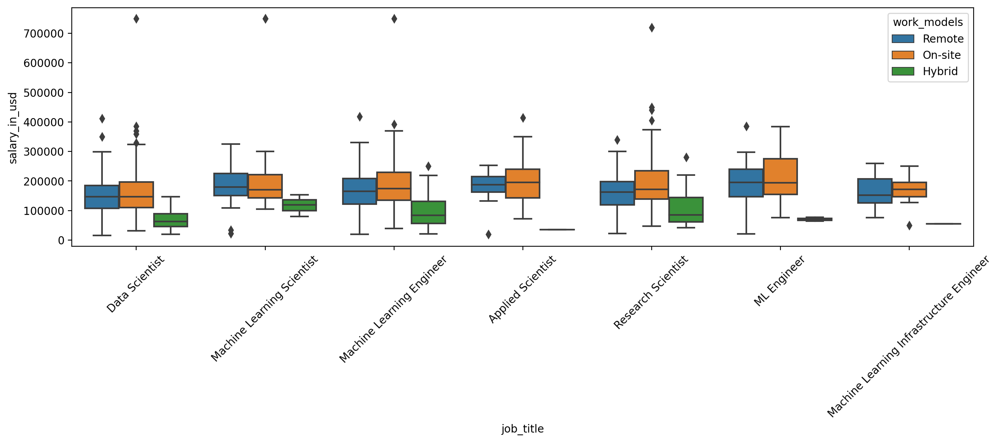

In [130]:
major_job_titles2 = [x for x in major_job_titles if 'scientist' in x.lower() or 'ml' in x.lower() or 'machine learning' in x.lower() ]
major_job_titles_df2 = df[df['job_title'].isin(major_job_titles2)]
plt.figure(figsize=(15, 4)) 
sns.boxplot(x="job_title", y="salary_in_usd", hue="work_models", data=major_job_titles_df2)
plt.xticks(rotation=45)
# plt.yscale('log')
plt.show()

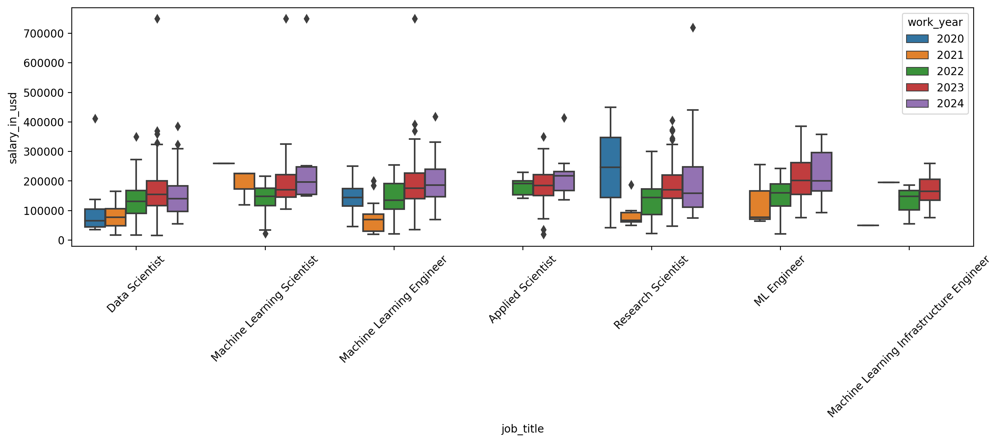

In [131]:
plt.figure(figsize=(15, 4)) 
sns.boxplot(x="job_title", y="salary_in_usd", hue="work_year", data=major_job_titles_df2)
plt.xticks(rotation=45)
# plt.yscale('log')

plt.show()

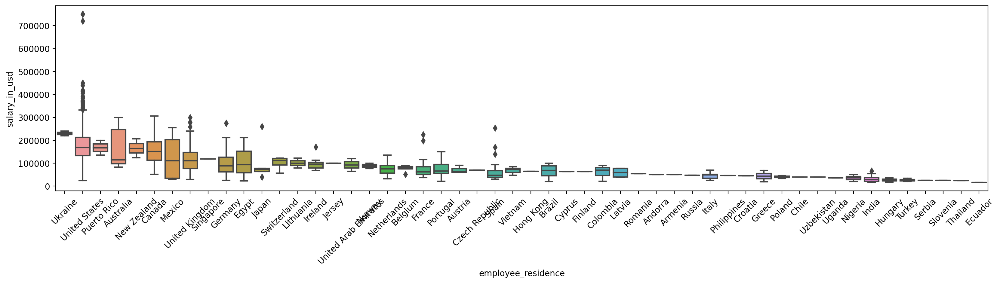

In [143]:
sorted_major_job_titles_df2 = major_job_titles_df2.sort_values(by = ['employee_residence','salary_in_usd'])

# output in the mean salary descending order
country_salary_stats = sorted_major_job_titles_df2.groupby('employee_residence')['salary_in_usd'].mean()  # or use median() instead of mean()
sorted_countries = country_salary_stats.sort_values(ascending=False).index


plt.figure(figsize=(20, 4)) 
sns.boxplot(x="employee_residence", y="salary_in_usd",data=major_job_titles_df2, order = sorted_countries)
plt.xticks(rotation=45)
# plt.yscale('log')

plt.show()

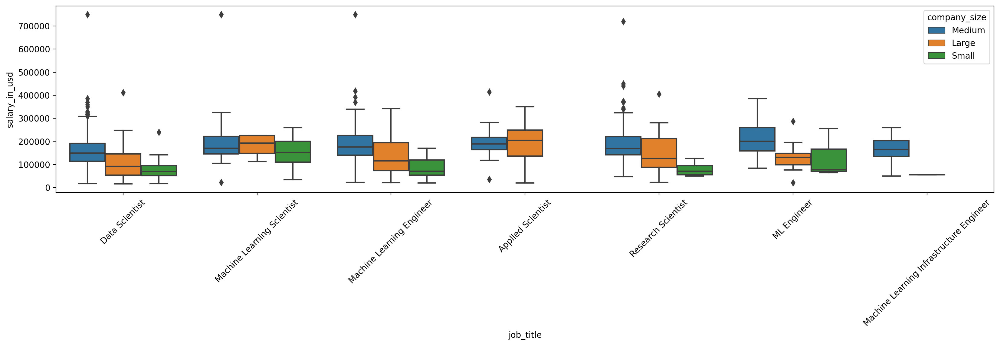

In [145]:
country_salary_stats = sorted_major_job_titles_df2.groupby('employee_residence')['salary_in_usd'].mean()  # or use median() instead of mean()
sorted_countries = country_salary_stats.sort_values(ascending=False).index


plt.figure(figsize=(20, 4)) 
sns.boxplot(x="job_title", y="salary_in_usd",hue = "company_size", data=major_job_titles_df2)
plt.xticks(rotation=45)
# plt.yscale('log')

plt.show()

In [13]:
os.chdir('/Users/emilyli/workspace/datasets/airbnb_market_analysis_and_real_estate_sales_data')
df2 = pd.read_csv('market_analysis_2019.csv', sep = ';')
df3 = pd.read_csv('market_analysis.csv', sep = ';')
df4 = pd.read_csv('amenities.csv', sep = ';')

df_joint = pd.concat([df2,df3],ignore_index = True, axis = 0)
df_joint['month'] = pd.to_datetime(df_joint['month'])
df4['month'] = pd.to_datetime(df4['month'])

df_joint['ym'] = df_joint['month'].dt.strftime('%Y-%m')
df_joint['yr'] = df_joint['month'].dt.year
df_joint['mo'] = df_joint['month'].dt.month

# str to int, replace , to . and na to 0 (numerical cleanup)
df_joint['nightly rate'] = [0 if pd.isna(x) else float(x.replace(',','.')) for x in df_joint['nightly rate']]
df_joint['revenue'] = [0 if pd.isna(x) else float(x.replace(',','.')) for x in df_joint['revenue']]
df_joint['occupancy'] = [0 if pd.isna(x) else float(x.replace(',','.')) for x in df_joint['occupancy']]

df_joint['lead time'] = [0 if pd.isna(x) else float(x.replace(',','.')) for x in df_joint['lead time']]
df_joint['length stay'] = [0 if pd.isna(x) else float(x.replace(',','.')) for x in df_joint['length stay']]
# df_joint = pd.merge(df_joint, df4, left_on = ['unified_id','month'],  right_on=['unified_id','month'])



<AxesSubplot:>

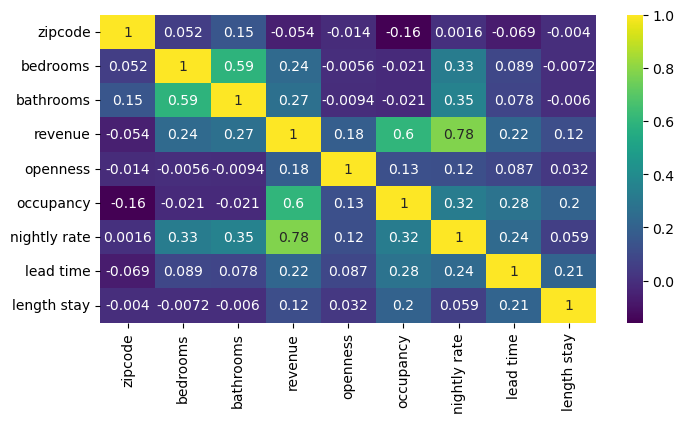

In [205]:
plt.figure(figsize=(8, 4)) 
# corrlation with heatmap
sns.heatmap(df_joint.corr(), annot = True, cmap = 'viridis')



<AxesSubplot:>

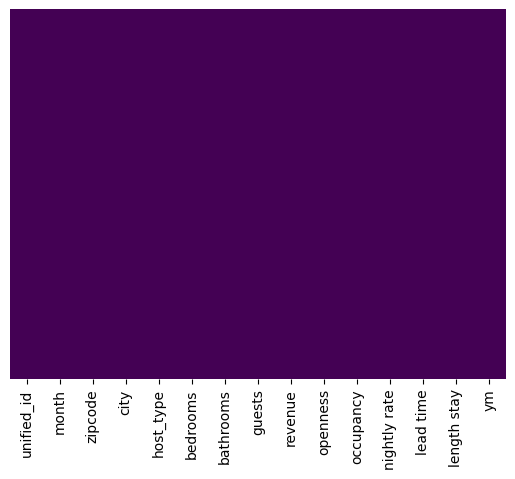

In [206]:
#heatmap to identify missing value
sns.heatmap(df_joint.isnull(), yticklabels=False, cbar=False,cmap='viridis')


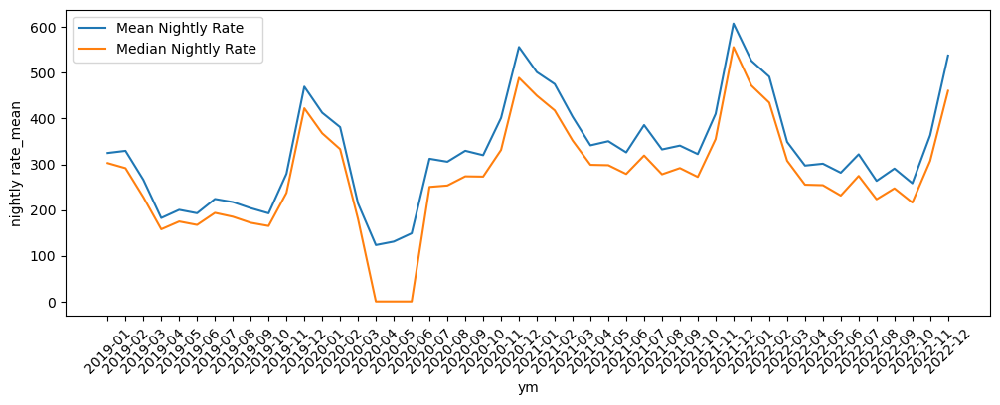

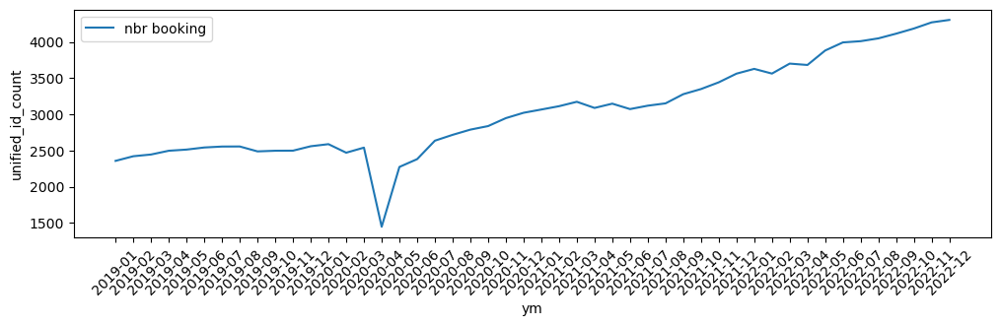

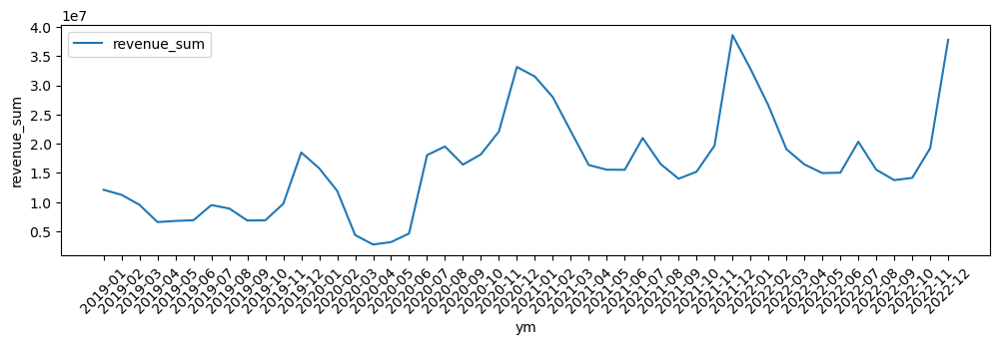

In [201]:
# having 2 level columns names
night_rate_stat = df_joint.groupby('ym').agg({'nightly rate':['mean', 'median'],'unified_id':'count', 'revenue':'sum'}).reset_index()

# Flatten multi-level column names to single level
night_rate_stat.columns = ['_'.join(col).strip() if col[1] != '' else col[0] for col in night_rate_stat.columns.values]
night_rate_stat

plt.figure(figsize=(12, 4)) 
#multiple numericals ts plot
sns.lineplot(x='ym', y='nightly rate_mean', data=night_rate_stat, label='Mean Nightly Rate')
sns.lineplot(x='ym', y='nightly rate_median', data=night_rate_stat, label='Median Nightly Rate')
# sns.lineplot(x='ym', y='unified_id_count', data=night_rate_stat, label='nbr booking')
plt.xticks(rotation=45)
# plt.yscale('log')
plt.show()

plt.figure(figsize=(12, 3)) 
sns.lineplot(x='ym', y='unified_id_count', data=night_rate_stat, label='nbr booking')
plt.xticks(rotation=45)
# plt.yscale('log')
plt.show()

plt.figure(figsize=(12, 3)) 
sns.lineplot(x='ym', y='revenue_sum', data=night_rate_stat, label='revenue_sum')
plt.xticks(rotation=45)
# plt.yscale('log')
plt.show()

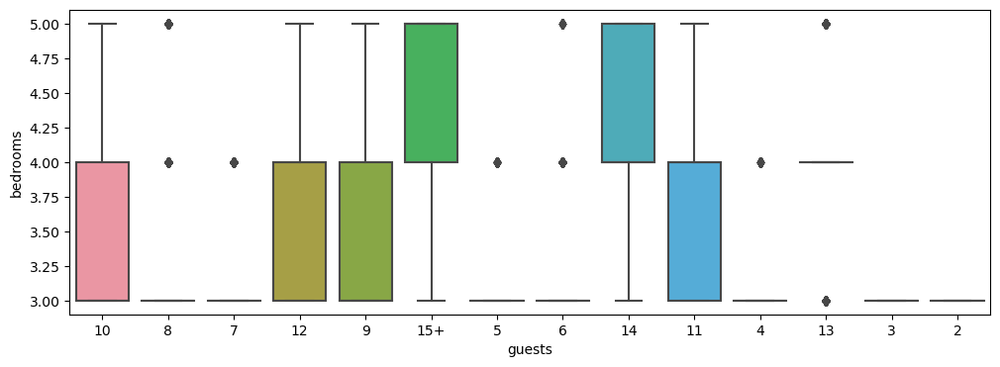

In [96]:
plt.figure(figsize=(12, 4)) 
sns.boxplot(x="guests", y="bedrooms",
            # hue = "bedrooms", 
            data=df_joint)
# plt.xticks(rotation=45)
# plt.yscale('log')

plt.show()

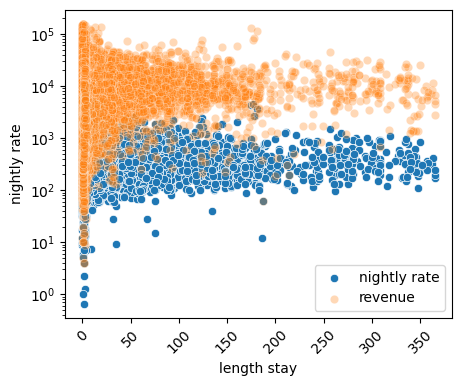

In [105]:
# scattter
# multiple scatter
plt.figure(figsize=(5, 4)) 
sns.scatterplot(x="length stay", y="nightly rate",alpha = 1, label='nightly rate',
            # hue = "length stay", 
            data=df_joint)
sns.scatterplot(x="length stay", y="revenue", alpha = 0.3, label='revenue', data=df_joint)

plt.xticks(rotation=45)
plt.yscale('log')

plt.show()


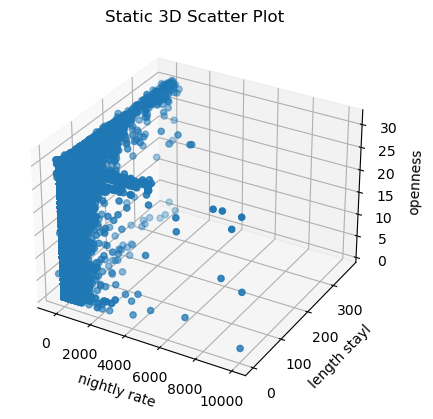

In [114]:
fig = plt.figure()
# static 3d scatter plot
# 3numerical
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_joint['nightly rate'] , df_joint['length stay'], df_joint['openness'])

# Set labels and title
ax.set_xlabel('nightly rate')
ax.set_ylabel('length stayl')
ax.set_zlabel('openness')
plt.title('Static 3D Scatter Plot')

# Show the plot
plt.show()



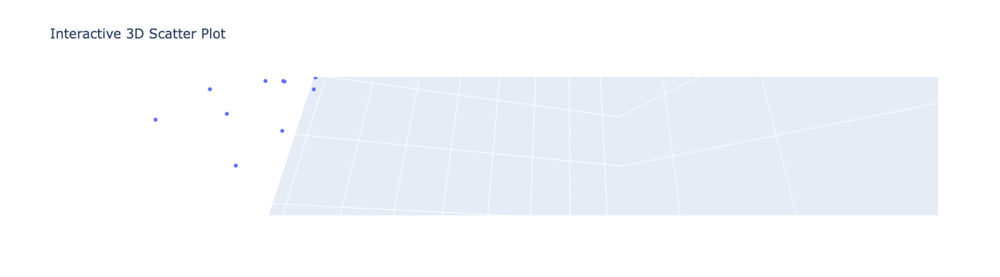

<Figure size 500x500 with 0 Axes>

In [123]:

plt.figure(figsize=(5, 5)) 

x = df_joint['nightly rate']
y = df_joint['length stay']
z = df_joint['openness']
# Ensure that x, y, and z have the same range
# fig = go.Figure(data=[go.Scatter3d(x=df_joint['nightly rate']  , y=df_joint['length stay'], z=df_joint['openness'], mode='markers', marker=dict(size=1))])
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=3))])

# Set layout
fig.update_layout(scene=dict(xaxis_title='nightly rate',
                             yaxis_title='length stay',
                             zaxis_title='openness',
                             aspectratio=dict(x=1, y=1, z=1)),
                  title='Interactive 3D Scatter Plot')

# Show the plot
fig.show()


/Users/emilyli/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='openness', ylabel='count'>

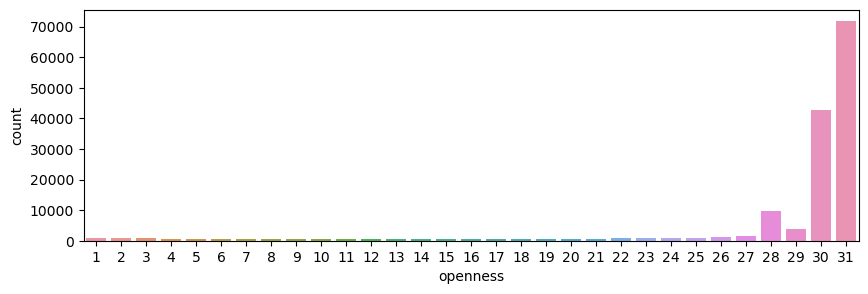

In [271]:
plt.figure( figsize = (10,3))

sns.countplot(df_joint['openness'])



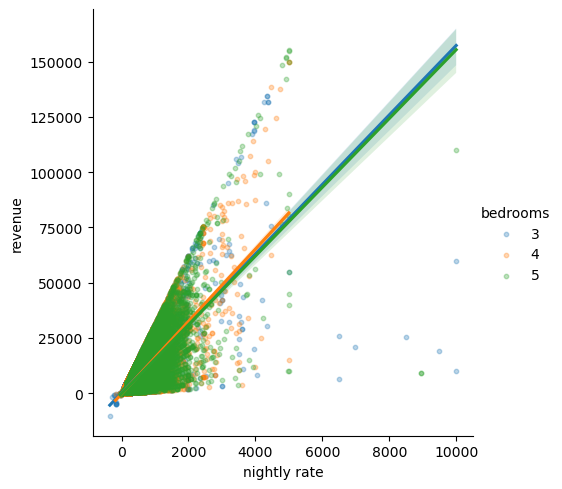

In [235]:
sns.lmplot(x = 'nightly rate', y = 'revenue', data = df_joint, hue = 'bedrooms', scatter_kws={'s': 10, 'alpha': 0.3})


In [330]:
cm_x = df4['hot_tub']
cm_y = df4['pool']
# confusion matrix, crosstab 
confusion_matrix = pd.crosstab(cm_x, cm_y, margins=True)
confusion_matrix

# Calculate row and column totals
row_totals = confusion_matrix.iloc[:-1, -1]
column_totals = confusion_matrix.iloc[-1, :-1]

# # Calculate percentages
confusion_matrix_percent = (confusion_matrix.div(confusion_matrix.iloc[-1, -1], axis=1) * 100).round(2)

confusion_matrix_combined = pd.concat([confusion_matrix, confusion_matrix_percent], keys=['Counts', 'Percentages'])
confusion_matrix_combined


pool                        0        1       All
            hot_tub                             
Counts      0        22323.00  1242.00  23565.00
            1        22952.00  2794.00  25746.00
            All      45275.00  4036.00  49311.00
Percentages 0           45.27     2.52     47.79
            1           46.55     5.67     52.21
            All         91.82     8.18    100.00

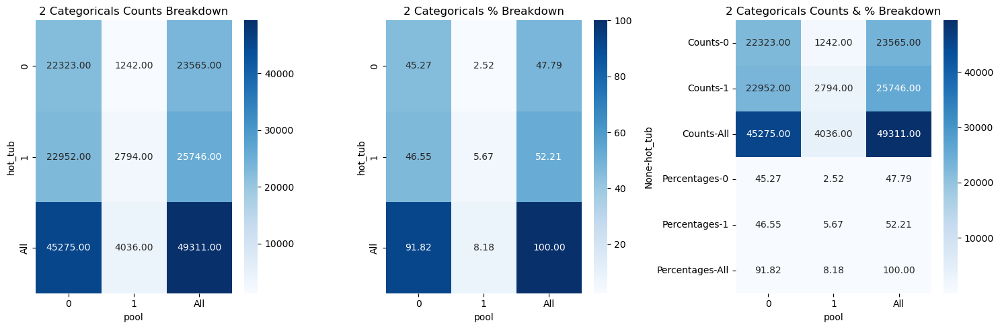

In [325]:
# Assuming df is your DataFrame with the actual and predicted labels
# Create a confusion matrix
cm_x = df4['hot_tub']
cm_y = df4['pool']

confusion_matrix = pd.crosstab(cm_x, cm_y, margins=True)
confusion_matrix

# Calculate row and column totals
row_totals = confusion_matrix.iloc[:-1, -1]
column_totals = confusion_matrix.iloc[-1, :-1]

# # Calculate percentages
confusion_matrix_percent = (confusion_matrix.div(confusion_matrix.iloc[-1, -1], axis=1) * 100).round(2)
# confusion_matrix_percent = confusion_matrix_percent.drop(index='All', columns='All')

# Concatenate counts and percentages
confusion_matrix_combined = pd.concat([confusion_matrix, confusion_matrix_percent], keys=['Counts', 'Percentages'])

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
# subplot to show multiple plots in one frame
sns.heatmap(confusion_matrix, annot=True, cmap='Blues', fmt='.2f',ax=axes[0])
axes[0].set_title('2 Categoricals Counts Breakdown')

sns.heatmap(confusion_matrix_percent, annot=True, cmap='Blues', fmt='.2f', ax=axes[1])
axes[1].set_title('2 Categoricals % Breakdown')

# Visualize the confusion matrix as a heatmap
sns.heatmap(confusion_matrix_combined, annot=True, cmap='Blues', fmt='.2f', ax=axes[2])
axes[2].set_title('2 Categoricals Counts & % Breakdown')
plt.tight_layout()
plt.show()

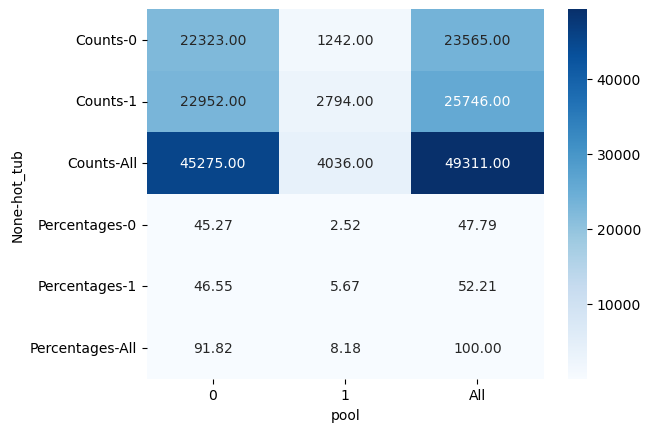

In [328]:
cm_x = df4['hot_tub']
cm_y = df4['pool']

confusion_matrix = pd.crosstab(cm_x, cm_y, margins=True)
confusion_matrix

# Calculate row and column totals
row_totals = confusion_matrix.iloc[:-1, -1]
column_totals = confusion_matrix.iloc[-1, :-1]

# # Calculate percentages
confusion_matrix_percent = (confusion_matrix.div(confusion_matrix.iloc[-1, -1], axis=1) * 100).round(2)
# confusion_matrix_percent = confusion_matrix_percent.drop(index='All', columns='All')

# Concatenate counts and percentages
confusion_matrix_combined = pd.concat([confusion_matrix, confusion_matrix_percent], keys=['Counts', 'Percentages'])

# all in single plot
# Visualize the confusion matrix as a heatmap
sns.heatmap(confusion_matrix_combined, annot=True, cmap='Blues', fmt='.2f')
plt.show()

In [47]:
os.chdir('/Users/emilyli/workspace/datasets/')
df5 = pd.read_csv('real_estate_texas_500_2024.csv', sep = ',')

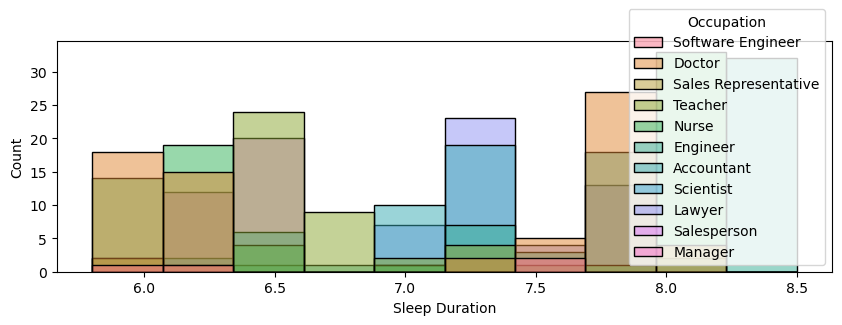

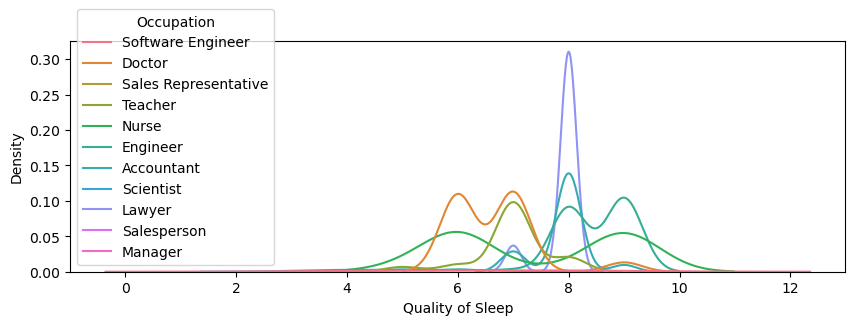

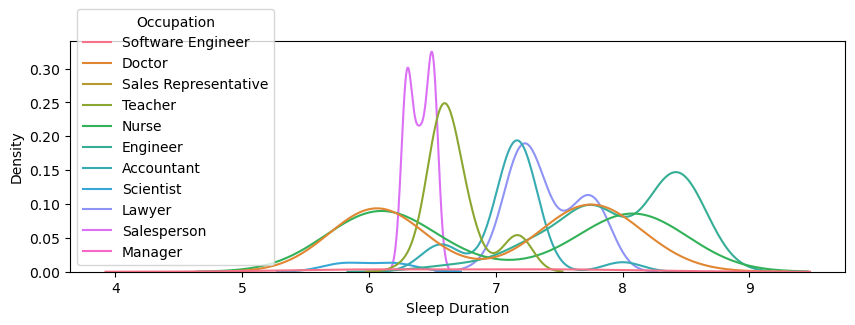

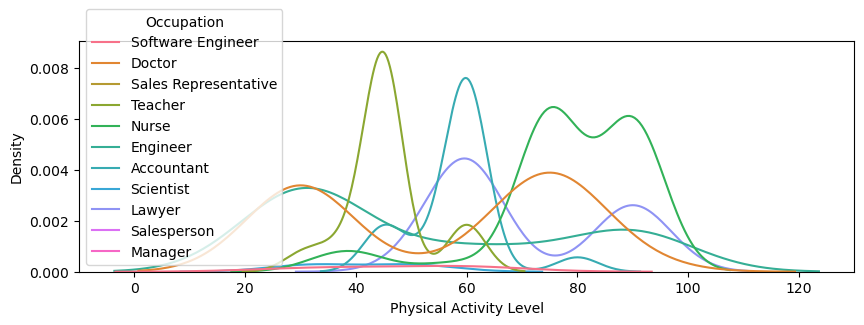

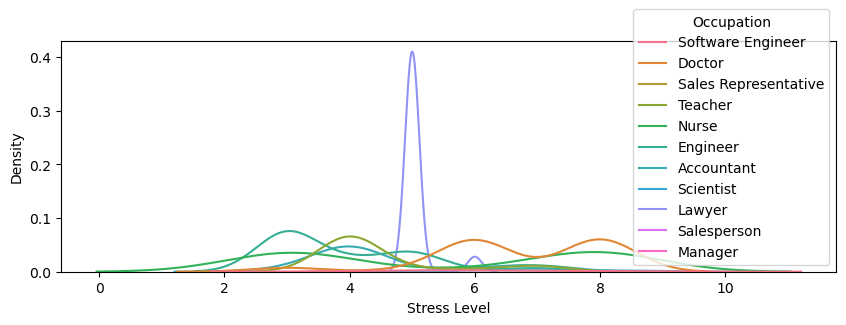

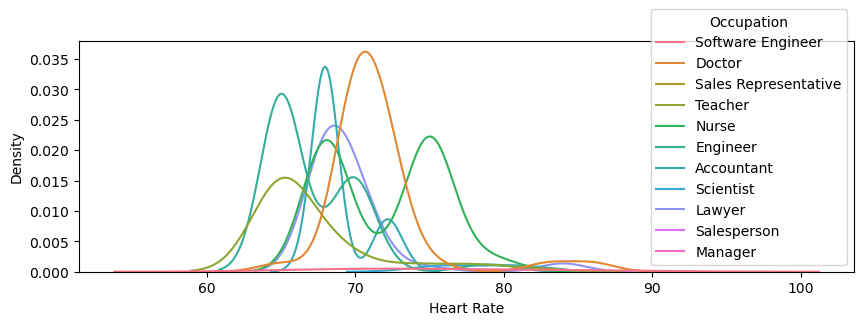

In [74]:


# sns.violinplot(y = df5['listPrice'], x = df5['beds'])
# plt.show()

plt.figure(figsize=(10, 3)) 
sns.color_palette() #default color scheme

# sns.color_palette("pastel")
# with sns.color_palette("Set3"):
# sns.color_palette("Set2")
# sns.color_palette("Spectral", as_cmap=True)
# sns.color_palette("husl", 9)

sns.color_palette("Set3")


# the warning could tell you if there's no variation in the plot then not proper to do density
sns.histplot(data=df6, x="Sleep Duration", hue="Occupation",)
#softcurve distribution by group level, 1numerical + 1categorical,
plt.figure(figsize=(10, 3)) 
sns.kdeplot(data=df6, x="Quality of Sleep", hue="Occupation",warn_singular=False, 
            # multiple="stack"
           )
plt.show()
plt.figure(figsize=(10, 3)) 
sns.kdeplot(data=df6, x="Sleep Duration", hue="Occupation",  warn_singular=False
            # multiple="stack"
           )
plt.show()
plt.figure(figsize=(10, 3)) 
sns.kdeplot(data=df6, x="Physical Activity Level", hue="Occupation", warn_singular=False
            # multiple="stack"
           )
plt.show()
plt.figure(figsize=(10, 3)) 
sns.kdeplot(data=df6, x="Stress Level", hue="Occupation", warn_singular=False
            # multiple="stack"
           )
plt.show()
plt.figure(figsize=(10, 3)) 

sns.kdeplot(data=df6, x="Heart Rate", hue="Occupation", warn_singular=False
            # multiple="stack"
           )
plt.show()


# plt.legend(loc='right', bbox_to_anchor=(1, 1))


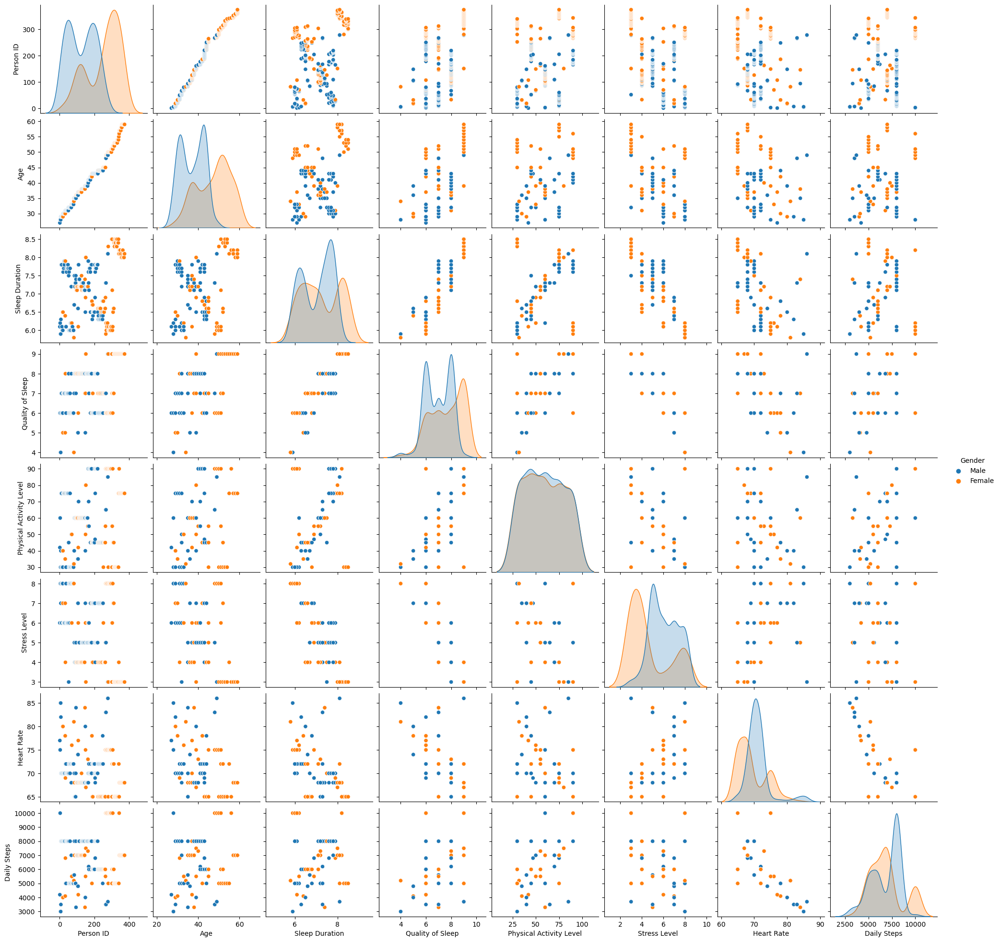

In [77]:
# a heatmap of multiple 2numerical + 1numerical (scatterplot by 1categorical)
sns.pairplot(data=df6, hue="Gender")
# sns.jointplot(data=penguins, x="flipper_length_mm", y="bill_length_mm", hue="species", kind="hist")


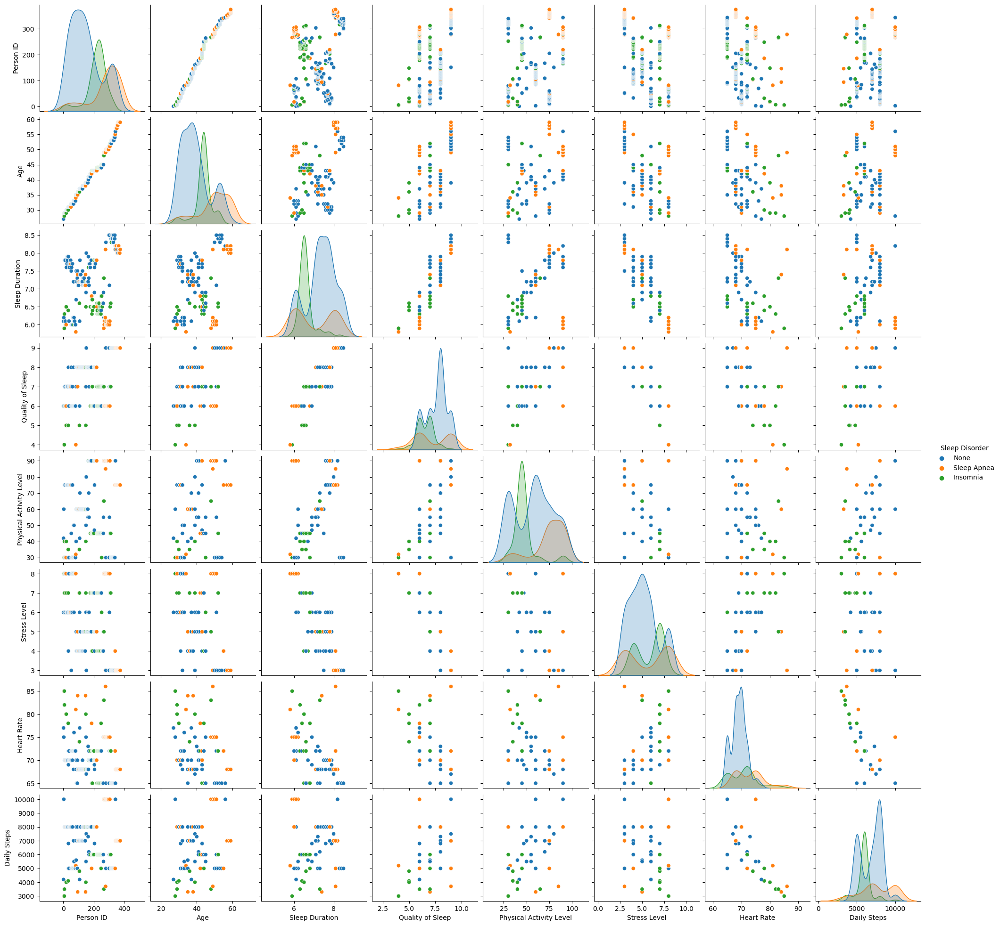

In [79]:
sns.pairplot(data=df6, hue="Sleep Disorder")


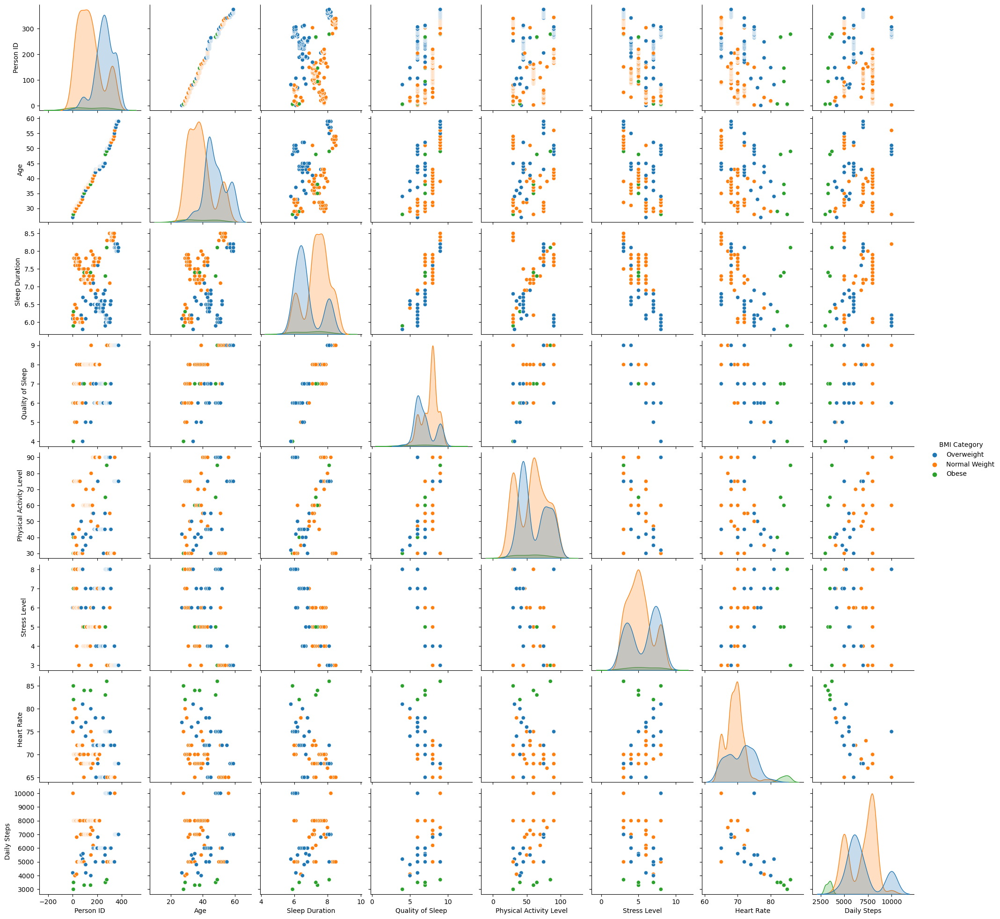

In [78]:
sns.pairplot(data=df6, hue="BMI Category")


In [52]:
df6.describe() #numerical distribution

,Person ID,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,Heart Rate,Daily Steps
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,187.500000,42.184492,7.132086,7.312834,59.171123,5.385027,70.165775,6816.844920
std,108.108742,8.673133,0.795657,1.196956,20.830804,1.774526,4.135676,1617.915679
min,1.000000,27.000000,5.800000,4.000000,30.000000,3.000000,65.000000,3000.000000
25%,94.250000,35.250000,6.400000,6.000000,45.000000,4.000000,68.000000,5600.000000
50%,187.500000,43.000000,7.200000,7.000000,60.000000,5.000000,70.000000,7000.000000
75%,280.750000,50.000000,7.800000,8.000000,75.000000,7.000000,72.000000,8000.000000
max,374.000000,59.000000,8.500000,9.000000,90.000000,8.000000,86.000000,10000.000000


In [53]:
# quickly check categoricals distribution 
for col in df6.select_dtypes(include=['object']).columns:
    print(f"Value counts for column '{col}':")
    print(df6[col].value_counts())
    print()

Value counts for column 'Gender':
Male      189
Female    185
Name: Gender, dtype: int64

Value counts for column 'Occupation':
Nurse                   73
Doctor                  71
Engineer                63
Lawyer                  47
Teacher                 40
Accountant              37
Salesperson             32
Software Engineer        4
Scientist                4
Sales Representative     2
Manager                  1
Name: Occupation, dtype: int64

Value counts for column 'BMI Category':
Normal Weight    216
Overweight       148
Obese             10
Name: BMI Category, dtype: int64

Value counts for column 'Blood Pressure':
130/85    99
140/95    65
125/80    65
120/80    45
115/75    32
135/90    27
140/90     4
125/82     4
132/87     3
128/85     3
126/83     2
115/78     2
139/91     2
142/92     2
119/77     2
135/88     2
129/84     2
128/84     2
131/86     2
117/76     2
130/86     2
118/75     2
121/79     1
122/80     1
118/76     1
Name: Blood Pressure, dtype: int64

Val

In [45]:
os.chdir('/Users/emilyli/workspace/datasets/')
df6 = pd.read_csv('Sleep_health_and_lifestyle_dataset.csv', sep = ',')
df6['BMI Category'] = df6['BMI Category'].replace({'Normal': 'Normal Weight'})


<Figure size 800x500 with 0 Axes>

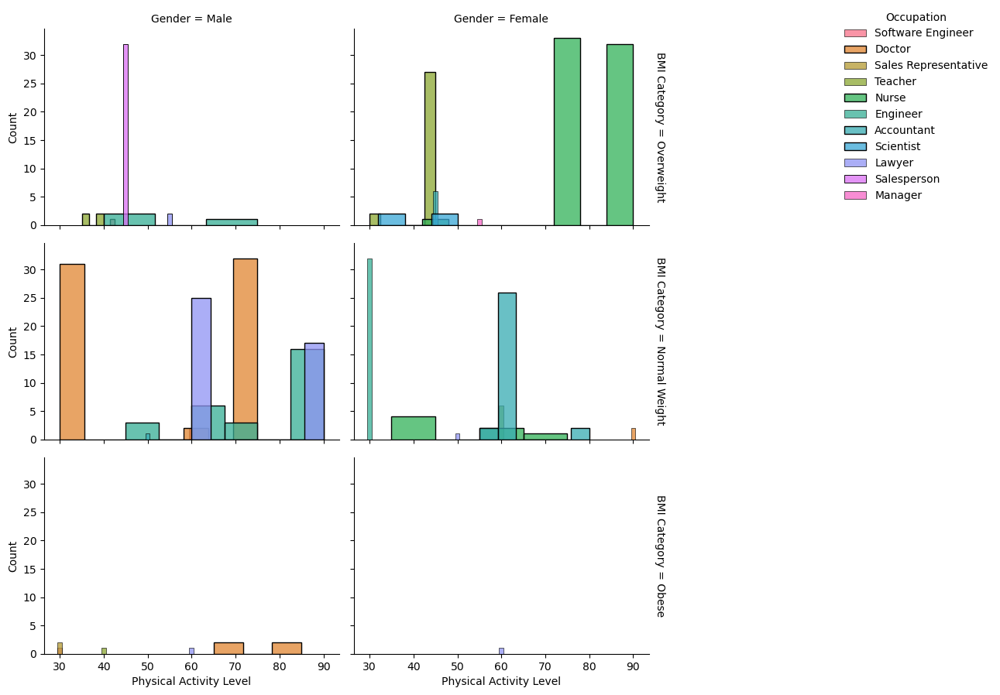

In [89]:
#numerical distribution histogram across 2 categoricals: 1numerical + 2categorical: 
plt.figure(figsize=(8, 5)) 
# Create FacetGrid
# 3categorical + 1numerical
g = sns.FacetGrid(df6, col='Gender', row='BMI Category',hue = 'Occupation', height=3, aspect=1.5, margin_titles=True)
# Map the histogram plot to each subplot
g.map(sns.histplot, 'Physical Activity Level')
g.add_legend(title='Occupation', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Adjust the spacing between subplots
# plt.subplots_adjust(hspace=0.5, wspace=0.5)

<Figure size 800x500 with 0 Axes>

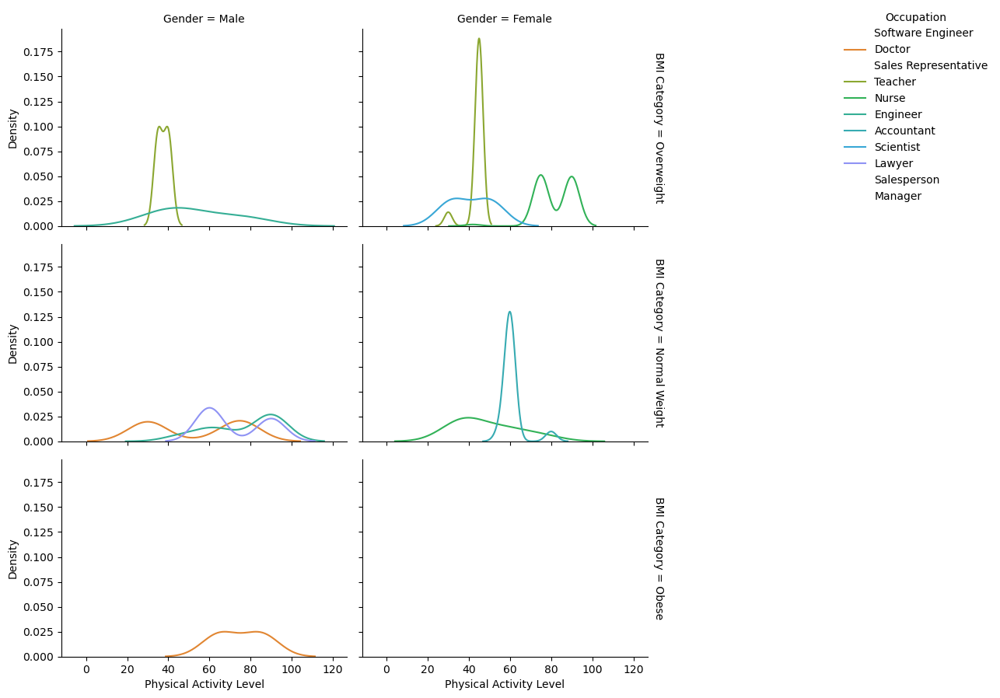

In [87]:
plt.figure(figsize=(8, 5)) 
# Create FacetGrid
# 3categorical + 1numerical
g = sns.FacetGrid(df6, col='Gender', row='BMI Category', hue = 'Occupation', height=3, aspect=1.5, margin_titles=True)
# Map the histogram plot to each subplot
g.map(sns.kdeplot, 'Physical Activity Level', warn_singular=False)
g.add_legend(title='Occupation', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


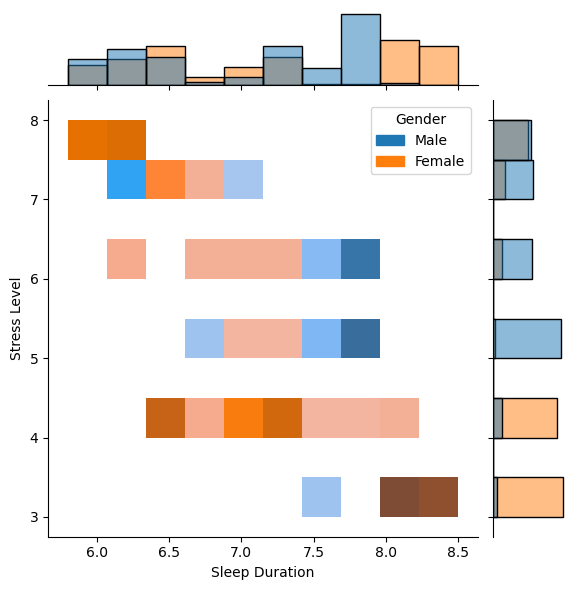

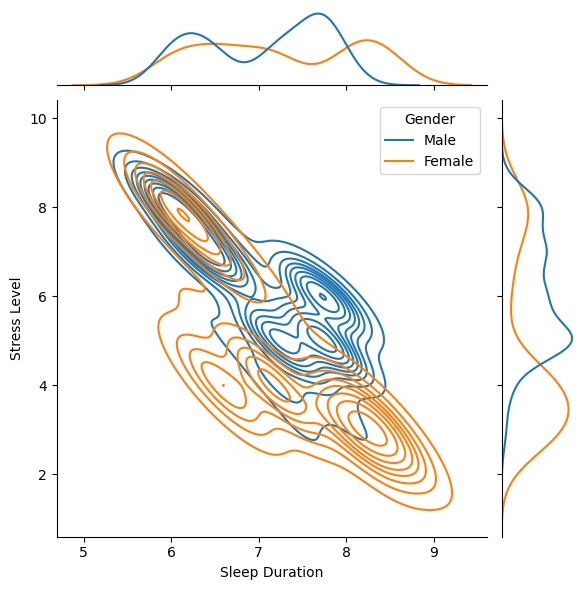

In [109]:
# 2numerical + 1categorical possibly
# kind arguement; scatter/ reg/ resid/ kde/ hex/ hist
sns.jointplot(data=df6, x="Sleep Duration", y="Stress Level",  hue="Gender", kind="hist")
plt.show()

sns.jointplot(data=df6, x="Sleep Duration", y="Stress Level", hue="Gender", kind="kde")

# g.add_legend(title='Gender', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

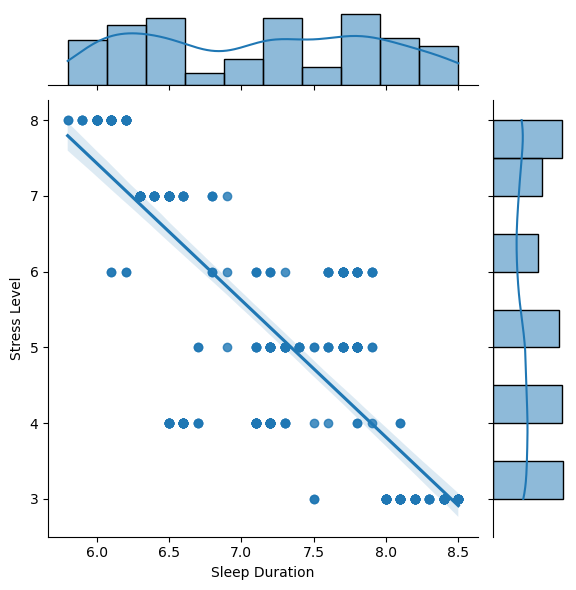

In [108]:
sns.jointplot(data=df6, x="Sleep Duration", y="Stress Level",  kind="reg")
plt.show()

# Simulation for Plots

In [137]:
# list of simple list
def flatten_list(nested_list):
    flattened_list = []
    stack = [nested_list]  # Start with the original nested list on the stack

    while stack:
        current = stack.pop()
        if isinstance(current, list):
            stack.extend(current)  # Extend the stack with each element of the current list
        else:
            flattened_list.append(current)  # Append non-list elements to the flattened list

    return flattened_list

In [ ]:
# list of array list
def flatten_list(nested_list):
    flattened_list = []
    stack = [nested_list]  # Start with the original nested list on the stack

    while stack:
        current = stack.pop()
        if isinstance(current, list):
            stack.extend(current)  # Extend the stack with each element of the current list
        elif isinstance(current, np.ndarray):
            flattened_list.extend(current.tolist())  # Convert NumPy array to list and append its elements
        else:
            flattened_list.append(current)  # Append non-list elements to the flattened list

    return flattened_list


Text(0.5, 1.0, 'pct_trt_lift vs. pct_stat_significant')

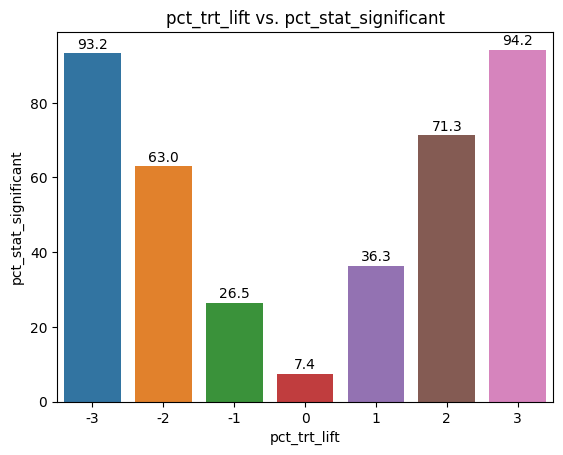

In [224]:
# Simulation
np.random.seed(12)

pct_trt_lift_range = list(range(-3,4))
pct_trt_lift = random.choices(pct_trt_lift_range, k=2000)
pct_trt_lift = sorted(pct_trt_lift)
pct_trt_lift_str = [str(item) for item in pct_trt_lift]
trt_lift_cnt = Counter(pct_trt_lift_str)

category_ranges = {
    '-3': (90,100),   
    '-2': (60,80),   
    '-1': (20,40),
    '0': (0,10),
    '1':  (20,40),  
     '2': (60,80), 
    '3': (90,100),

}

# pct_stat_significant = np.random.randint(0, end + 1, size=n)

nested_pct_stat_significant = [] 

for category, (start, end) in category_ranges.items():
    # print(category)
    # print(trt_lift_cnt.get(category))
    # print(start, end)
    sim_n = trt_lift_cnt.get(category)
    # print(start, end + 1,sim_n)
    stat_significant = np.random.randint(start, end, size=sim_n)  # Generating 10 random integers for each group
    # print(np.mean(stat_significant).round())
    nested_pct_stat_significant.append(stat_significant)
    

pct_stat_significant = flatten_list(nested_pct_stat_significant)

# pct_trt_lift = sorted(pct_trt_lift)
df8 = pd.DataFrame({'pct_trt_lift': pct_trt_lift, 'pct_stat_significant': pct_stat_significant})
df8['pct_trt_lift'] = df8['pct_trt_lift'].astype(str)
# Create the bar plot
# sns.barplot(data=df8)

ax = sns.barplot(x=pct_trt_lift, y=pct_stat_significant, errorbar=None)

for bar, value in zip(ax.patches, pct_stat_significant):
    # print(bar)
    # print(value)
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5, 
            f'{bar.get_height().round(1)}', ha='center', va='bottom')
    
plt.xlabel('pct_trt_lift')
plt.ylabel('pct_stat_significant')
plt.title('pct_trt_lift vs. pct_stat_significant')


In [223]:
df8.groupby('pct_trt_lift').describe()

pct_stat_significant                                           
                            count       mean        std   min   25%   50%   
pct_trt_lift                                                                
-1                          282.0  33.205674  12.538350  20.0  26.0  31.0  \
-2                          275.0  69.596364   6.002492  60.0  65.0  69.0   
-3                          304.0  93.707237   4.879047  64.0  92.0  94.0   
0                           266.0   5.894737   6.242596   0.0   3.0   5.0   
1                           270.0  28.325926   7.767370   0.0  24.0  29.0   
2                           307.0  67.449511  12.796799  20.0  64.0  69.0   
3                           296.0  94.226351   2.799415  90.0  92.0  94.0   

                          
               75%   max  
pct_trt_lift              
-1            36.0  79.0  
-2            75.0  79.0  
-3            97.0  99.0  
0              7.0  38.0  
1             34.0  39.0  
2             75.0  96.0  
3             97.0  99.0